Usage example of MediaPipe Pose Solution API in Python (see also http://solutions.mediapipe.dev/pose).

In [1]:
!pip install mediapipe

     |████████████████████████████████| 32.8 MB 1.9 MB/s 


Upload any image that that has a person. We take two example images from the web: https://unsplash.com/photos/v4zceVZ5HK8 and https://unsplash.com/photos/e_rhazQLaSs.


In [2]:
from google.colab import files
uploaded = files.upload()

Saving swing1.jpeg to swing1.jpeg
Saving swing2.jpeg to swing2.jpeg
Saving swing3.jpeg to swing3.jpeg
Saving swing4.jpeg to swing4.jpeg
Saving swing5.jpeg to swing5.jpeg
Saving swing6.jpeg to swing6.jpeg
Saving swing7.jpeg to swing7.jpeg
Saving swing8.jpeg to swing8.jpeg
Saving swing9.jpeg to swing9.jpeg
Saving swing10.jpeg to swing10.jpeg
Saving swing11.jpeg to swing11.jpeg
Saving swing12.jpeg to swing12.jpeg
Saving swing13.jpeg to swing13.jpeg
Saving swing14.jpeg to swing14.jpeg
Saving swing15.jpeg to swing15.jpeg


swing1.jpeg
Right Elbow coordinates: (420.4307011961937, 353.8791060447693)
Pose landmarks of swing1.jpeg:
Right Elbow landmark:
x: -0.0596710629761219
y: -0.08369851112365723
z: -0.30500170588493347
visibility: 0.9891224503517151



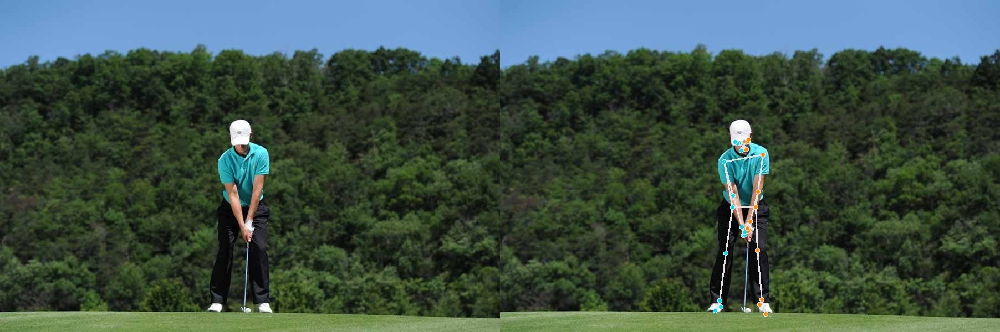

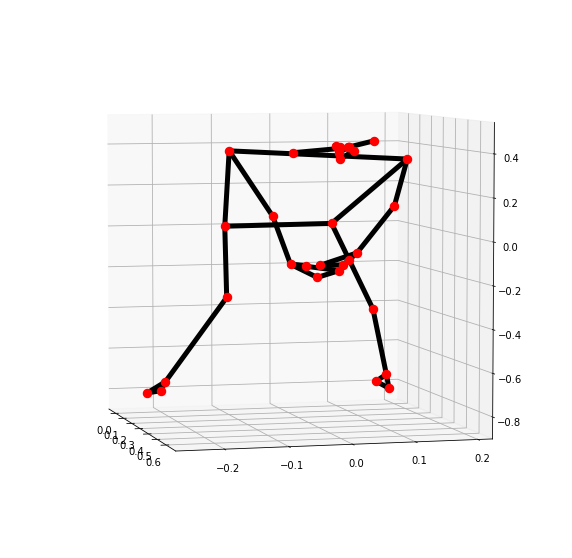

swing2.jpeg
Right Elbow coordinates: (380.72087347507477, 344.26653385162354)
Pose landmarks of swing2.jpeg:
Right Elbow landmark:
x: -0.22801458835601807
y: -0.13833454251289368
z: -0.2234167605638504
visibility: 0.9569830298423767



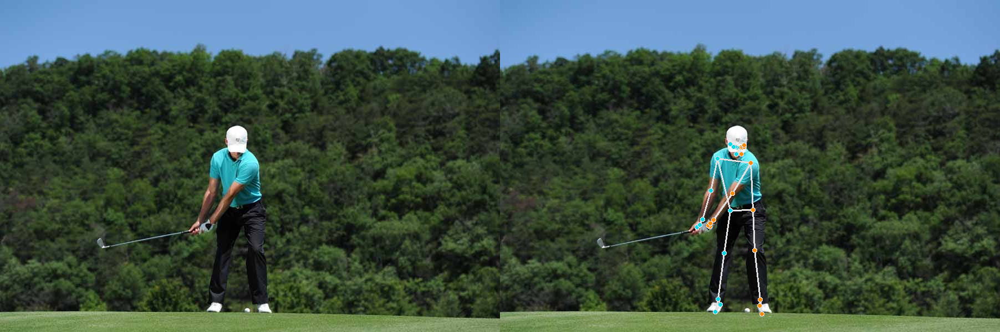

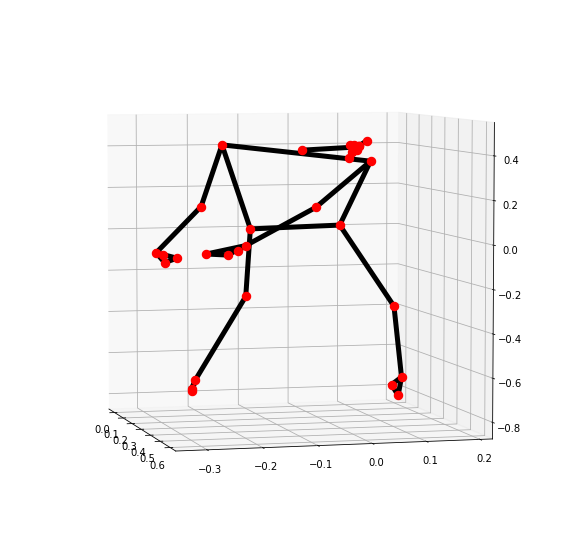

swing3.jpeg
Right Elbow coordinates: (374.9183252453804, 320.0286626815796)
Pose landmarks of swing3.jpeg:
Right Elbow landmark:
x: -0.28106042742729187
y: -0.30618953704833984
z: -0.06841858476400375
visibility: 0.4878430664539337



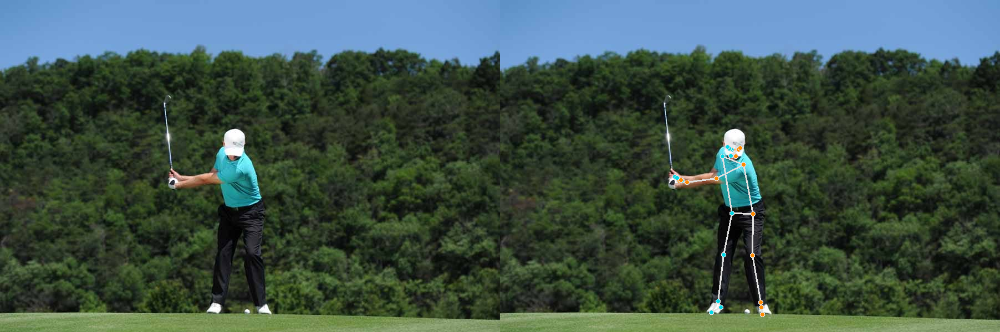

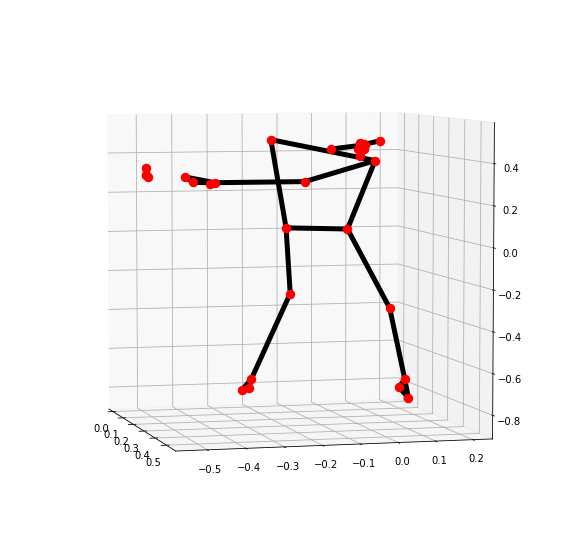

swing4.jpeg
Right Elbow coordinates: (367.74013316631317, 283.2806646823883)
Pose landmarks of swing4.jpeg:
Right Elbow landmark:
x: -0.33959507942199707
y: -0.5369500517845154
z: -0.03167064115405083
visibility: 0.709832489490509



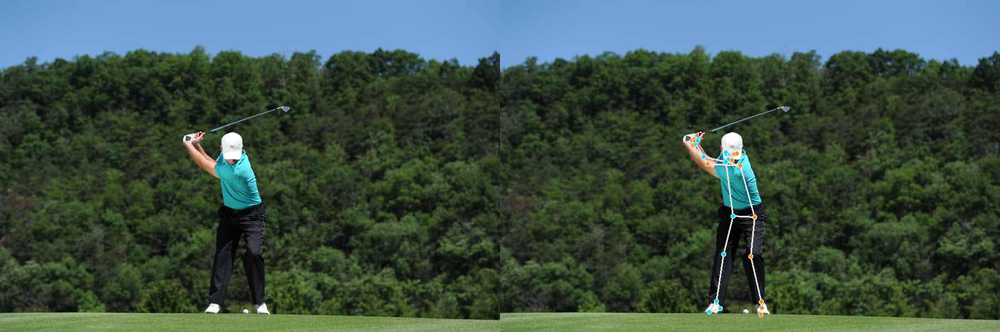

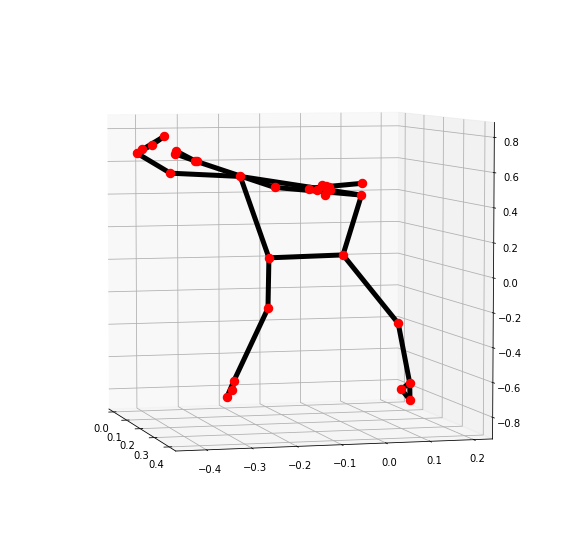

swing5.jpeg
Right Elbow coordinates: (395.4297841787338, 345.82836627960205)
Pose landmarks of swing5.jpeg:
Right Elbow landmark:
x: -0.26516732573509216
y: -0.18932314217090607
z: -0.2619149386882782
visibility: 0.31265735626220703



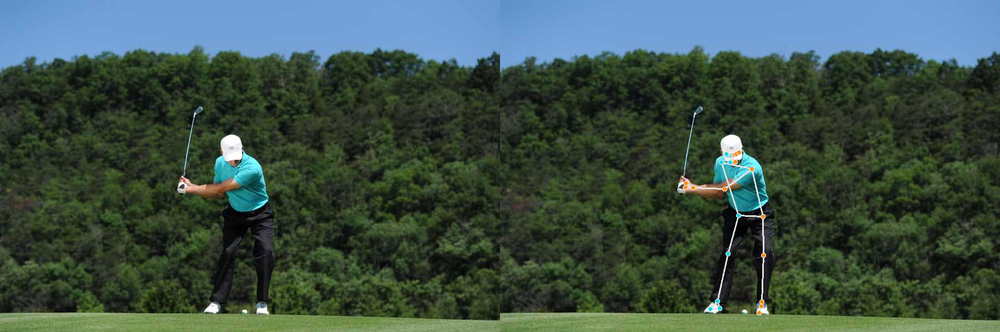

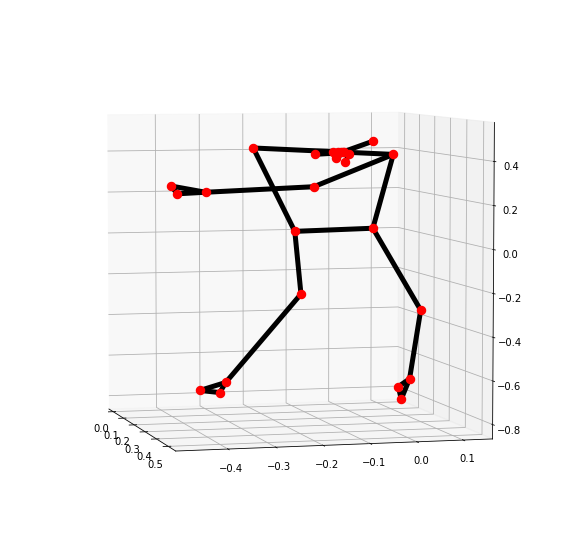

swing6.jpeg
Right Elbow coordinates: (440.6613270640373, 359.7287178039551)
Pose landmarks of swing6.jpeg:
Right Elbow landmark:
x: -0.044823382049798965
y: -0.10095968842506409
z: -0.31745439767837524
visibility: 0.9775794148445129



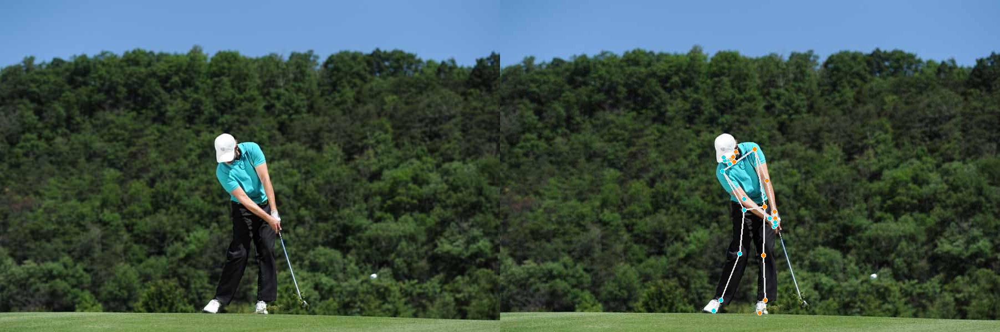

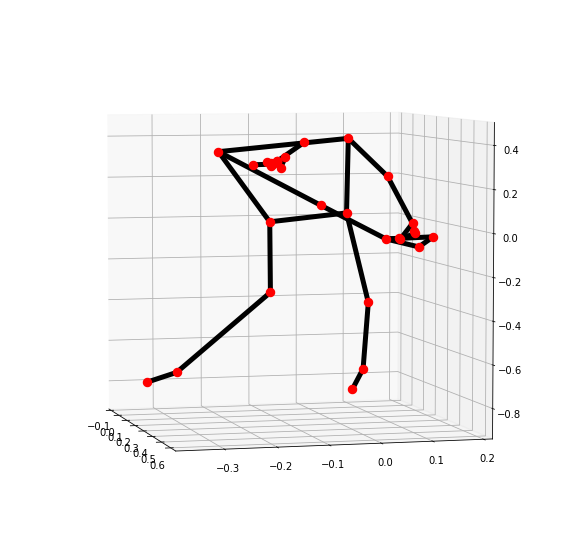

swing7.jpeg
Right Elbow coordinates: (493.747217297554, 295.6669270992279)
Pose landmarks of swing7.jpeg:
Right Elbow landmark:
x: 0.11714965105056763
y: -0.3564608693122864
z: -0.3700566291809082
visibility: 0.9747128486633301



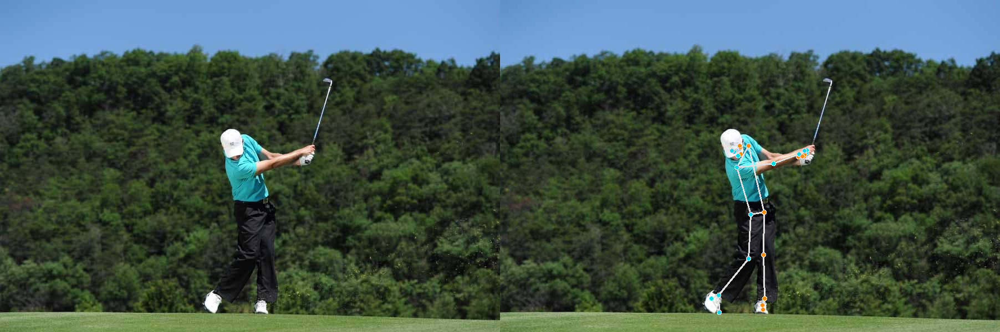

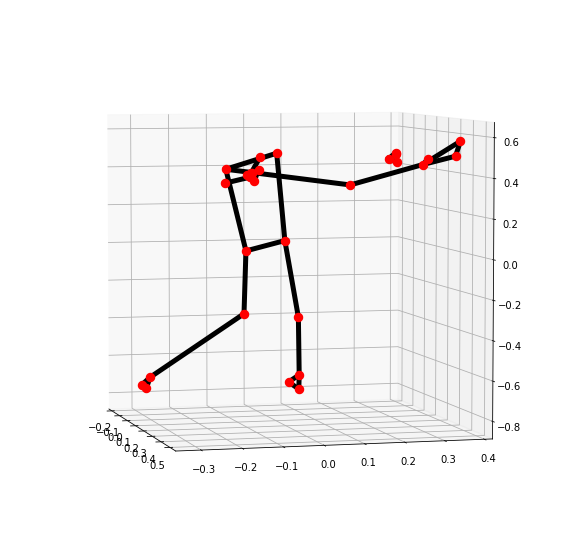

swing8.jpeg
Right Elbow coordinates: (458.48069179058075, 248.48493933677673)
Pose landmarks of swing8.jpeg:
Right Elbow landmark:
x: -0.046876318752765656
y: -0.5208954811096191
z: -0.04996772110462189
visibility: 0.47726619243621826



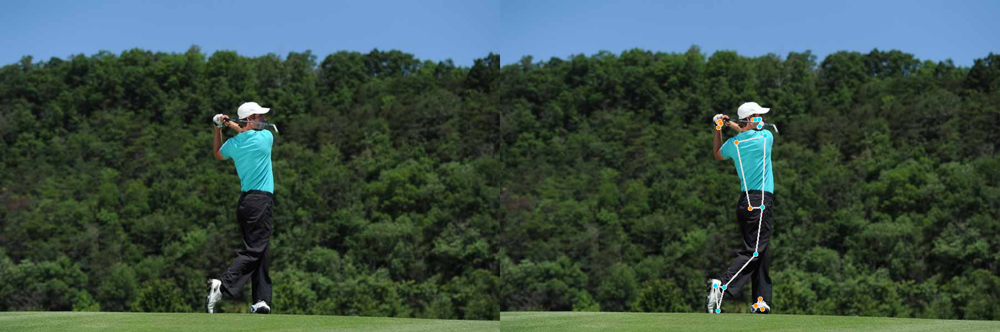

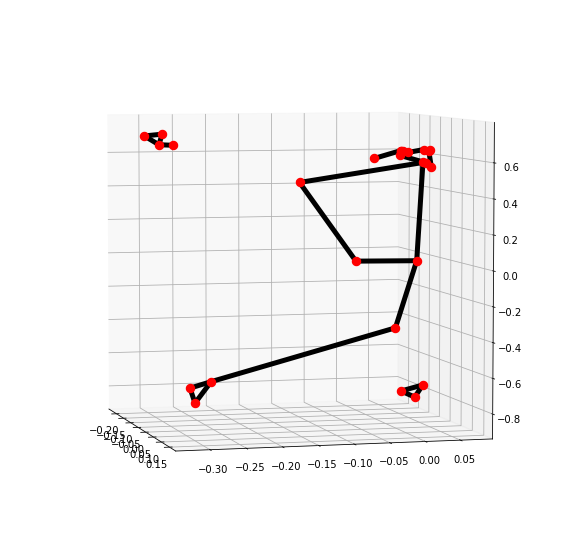

swing9.jpeg
Right Elbow coordinates: (350.4519776105881, 351.92002058029175)
Pose landmarks of swing9.jpeg:
Right Elbow landmark:
x: 0.2772682309150696
y: -0.035668835043907166
z: -0.26028069853782654
visibility: 0.9976413249969482



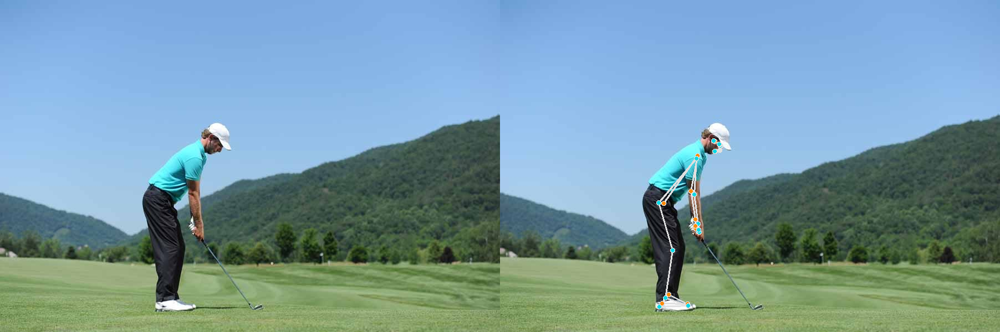

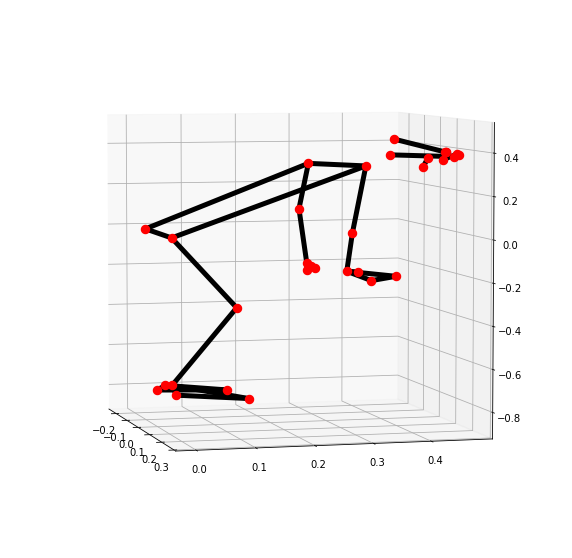

swing10.jpeg
Right Elbow coordinates: (326.9408441185951, 335.4113817214966)
Pose landmarks of swing10.jpeg:
Right Elbow landmark:
x: 0.17038552463054657
y: -0.10107594728469849
z: -0.2600131630897522
visibility: 0.9961966276168823



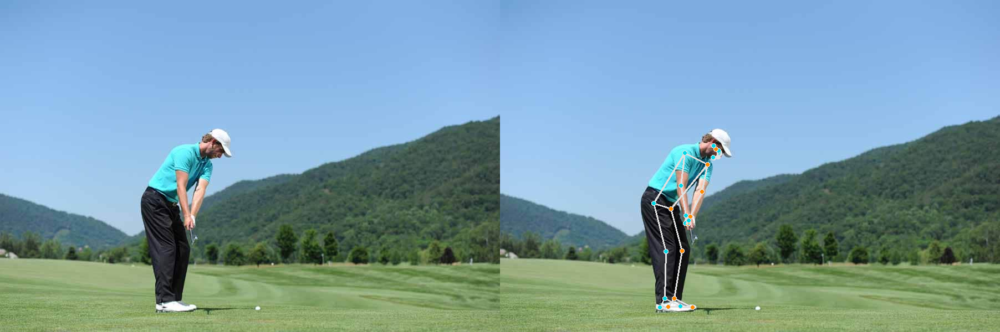

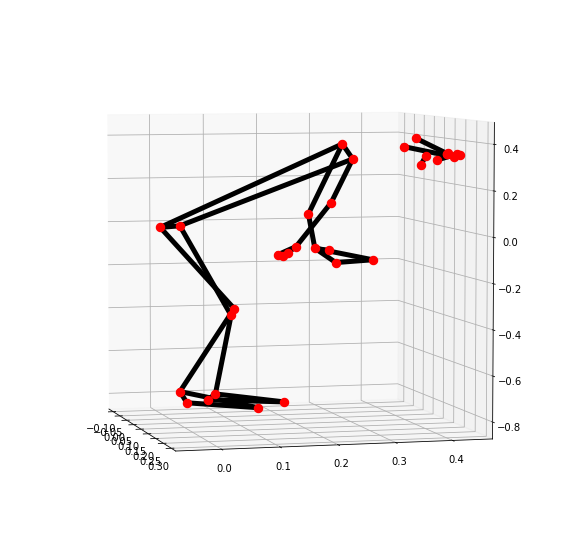

swing11.jpeg
Right Elbow coordinates: (302.9391734600067, 294.37538981437683)
Pose landmarks of swing11.jpeg:
Right Elbow landmark:
x: 0.06951478123664856
y: -0.32890984416007996
z: -0.185220867395401
visibility: 0.883183479309082



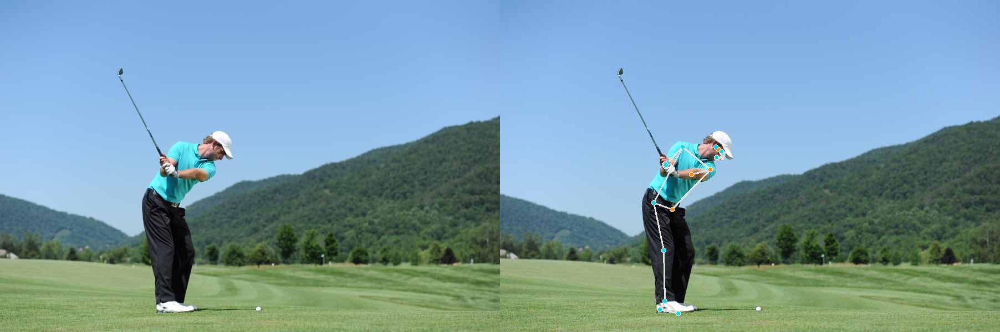

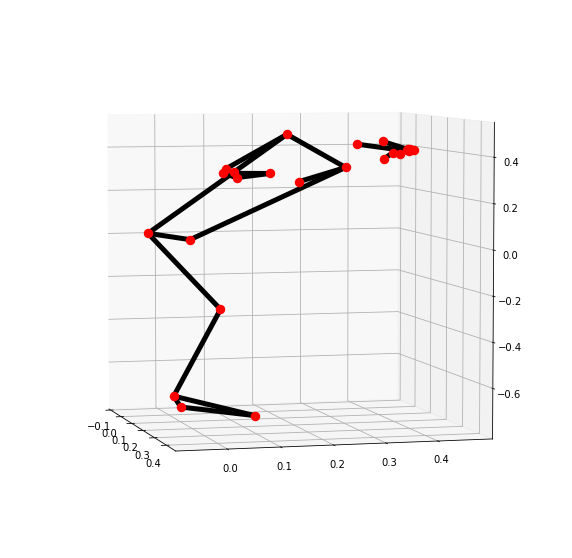

swing12.jpeg
Right Elbow coordinates: (282.9031979441643, 281.40079379081726)
Pose landmarks of swing12.jpeg:
Right Elbow landmark:
x: 0.01417471468448639
y: -0.43349510431289673
z: -0.10272005200386047
visibility: 0.6635695695877075



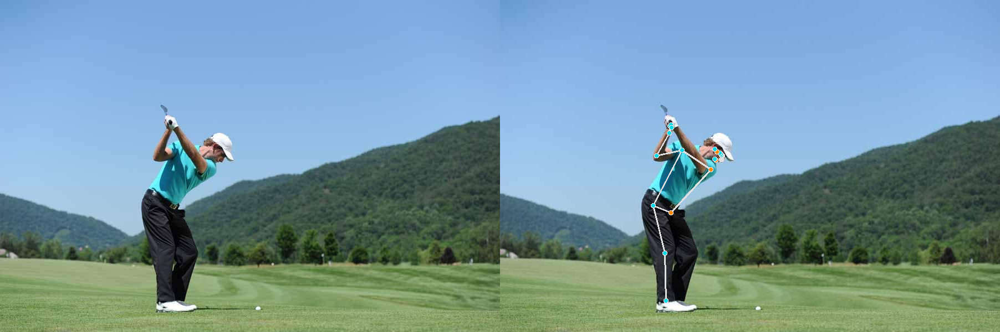

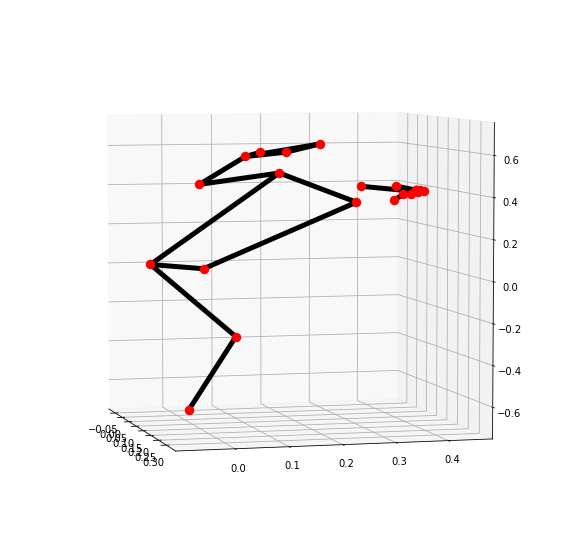

swing13.jpeg
Right Elbow coordinates: (313.68636751174927, 309.63746309280396)
Pose landmarks of swing13.jpeg:
Right Elbow landmark:
x: 0.12659446895122528
y: -0.25957441329956055
z: -0.16537706553936005
visibility: 0.9629573225975037



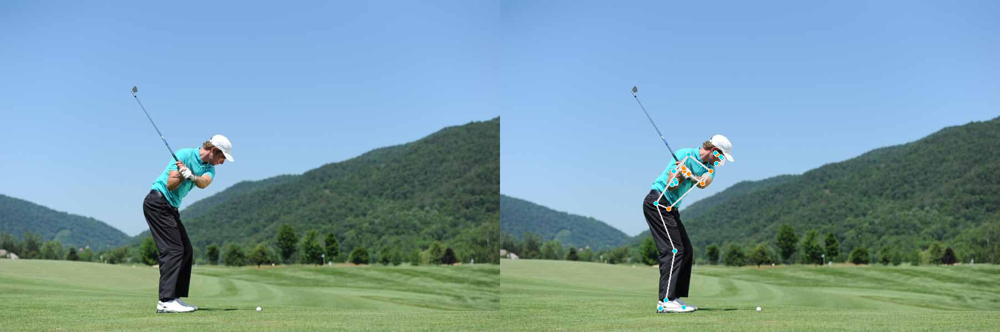

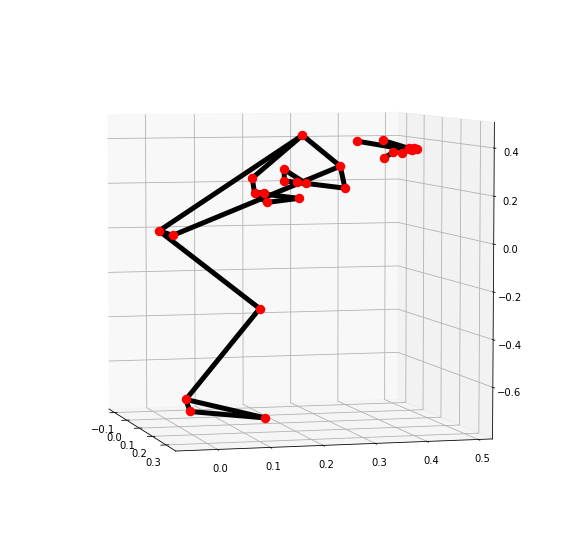

swing14.jpeg
Right Elbow coordinates: (356.92331552505493, 310.2874159812927)
Pose landmarks of swing14.jpeg:
Right Elbow landmark:
x: 0.2777143716812134
y: -0.2493342012166977
z: -0.3152690529823303
visibility: 0.4133375883102417



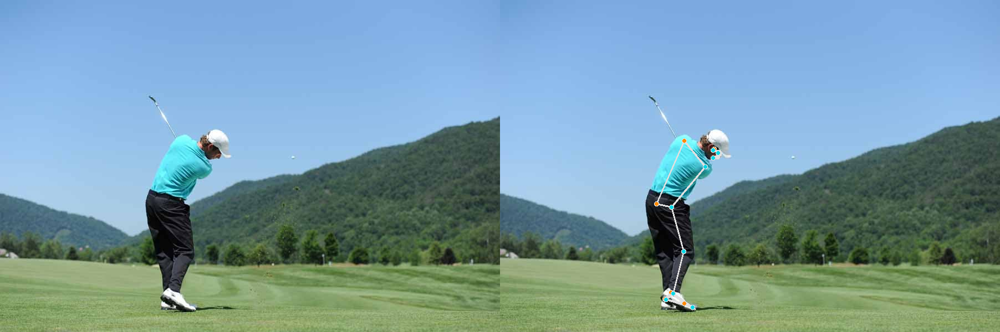

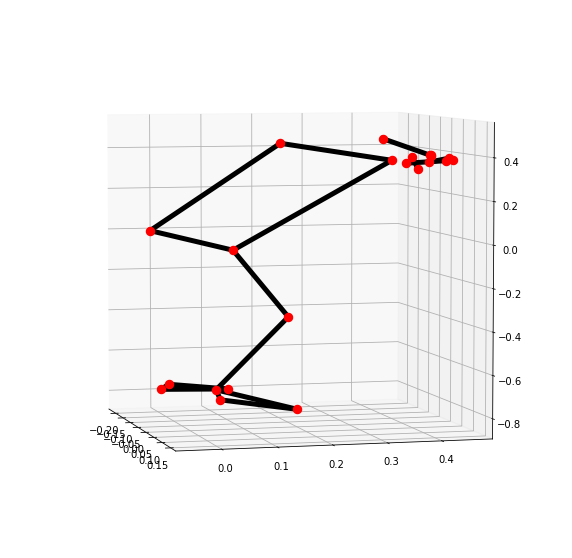

swing15.jpeg
Right Elbow coordinates: (306.5365087389946, 263.2761776447296)
Pose landmarks of swing15.jpeg:
Right Elbow landmark:
x: -0.01528523862361908
y: -0.47503626346588135
z: 0.19798003137111664
visibility: 0.023315414786338806



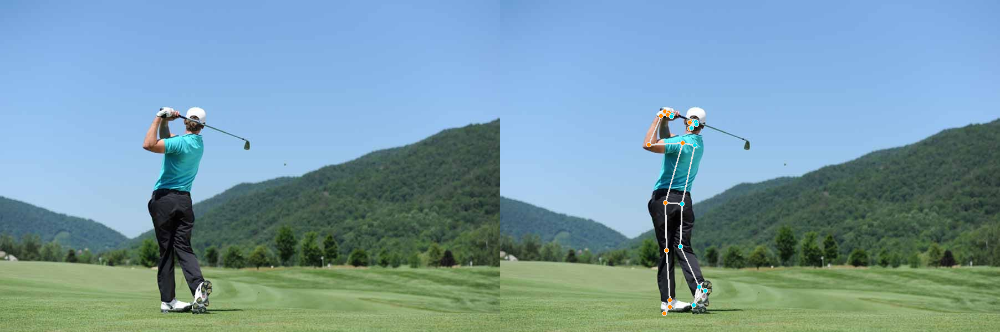

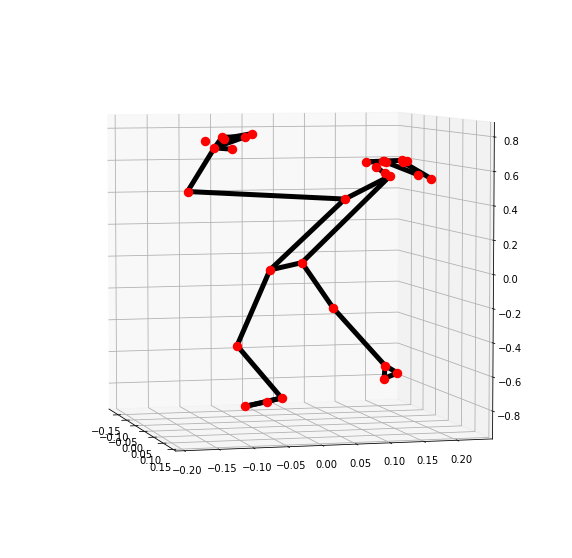

In [14]:
import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np
import mediapipe as mp
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils 
mp_drawing_styles = mp.solutions.drawing_styles


DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image, show=True):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  if show:
    cv2_imshow(img)
  else:
    return img

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  image1= resize_and_show(image, show=False)
  # Run MediaPipe Pose and draw pose landmarks.
  with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
    # Convert the BGR image to RGB and process it with MediaPipe Pose.
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    # Print nose landmark.
    image_hight, image_width, _ = image.shape
    if not results.pose_landmarks:
      continue
    print(
      f'Right Elbow coordinates: ('
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_ELBOW].x * image_width}, '
      f'{results.pose_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_ELBOW].y * image_hight})'
    )

    # Draw pose landmarks.
    print(f'Pose landmarks of {name}:')
    annotated_image = image.copy()
    mp_drawing.draw_landmarks(
        annotated_image,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())
    image2= resize_and_show(annotated_image, show=False )
  with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print the real-world 3D coordinates of nose in meters with the origin at
    # the center between hips.
    print('Right Elbow landmark:'),
    print(results.pose_world_landmarks.landmark[mp_pose.PoseLandmark.RIGHT_ELBOW])
    


    numpy_horizontal= np.hstack((image, annotated_image))
    cv2_imshow(numpy_horizontal)
    # Plot pose world landmarks.
    mp_drawing.plot_landmarks(
        results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS,  elevation = 5, azimuth=-15)



Nose world landmark:
x: -0.0075208768248558044
y: -0.4069547951221466
z: -0.6218793392181396
visibility: 0.999992847442627



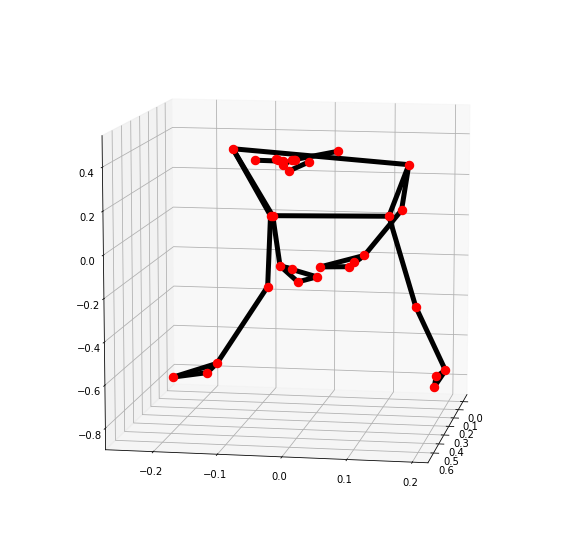

Nose world landmark:
x: -0.020014934241771698
y: -0.4184414744377136
z: -0.5735714435577393
visibility: 0.9999490976333618



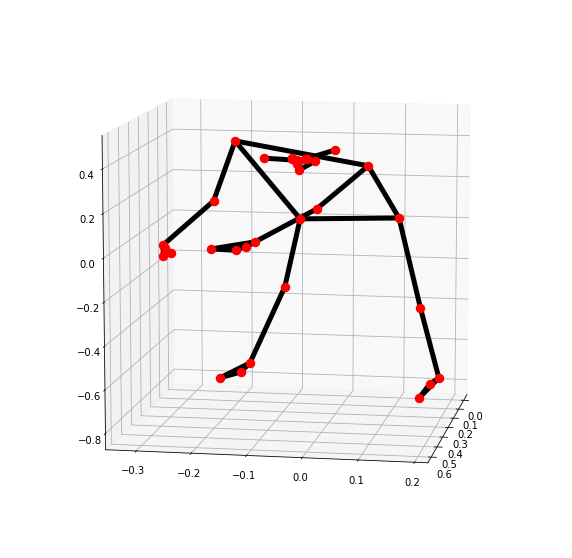

Nose world landmark:
x: -0.0800647884607315
y: -0.466738224029541
z: -0.5091870427131653
visibility: 0.9997747540473938



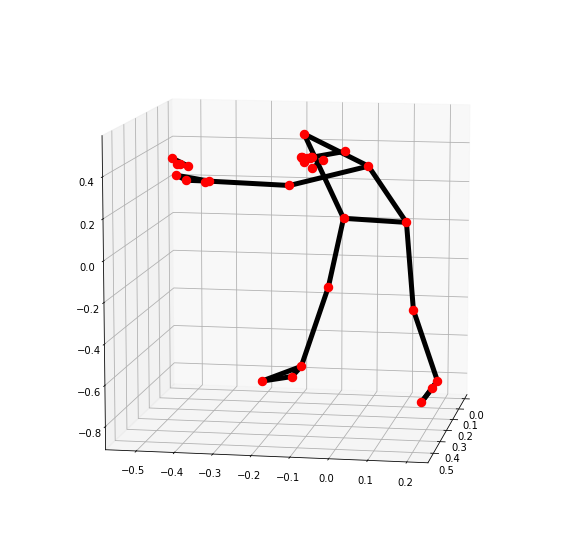

Nose world landmark:
x: -0.1339791715145111
y: -0.5024524927139282
z: -0.3898375928401947
visibility: 0.9985572695732117



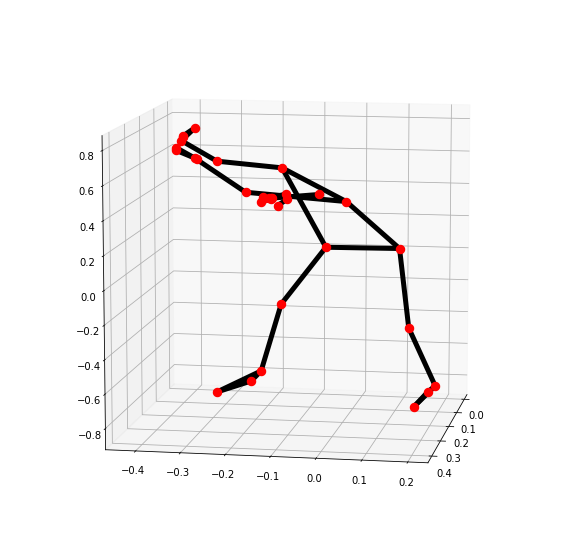

Nose world landmark:
x: -0.15273961424827576
y: -0.41541293263435364
z: -0.4943547248840332
visibility: 0.9994391798973083



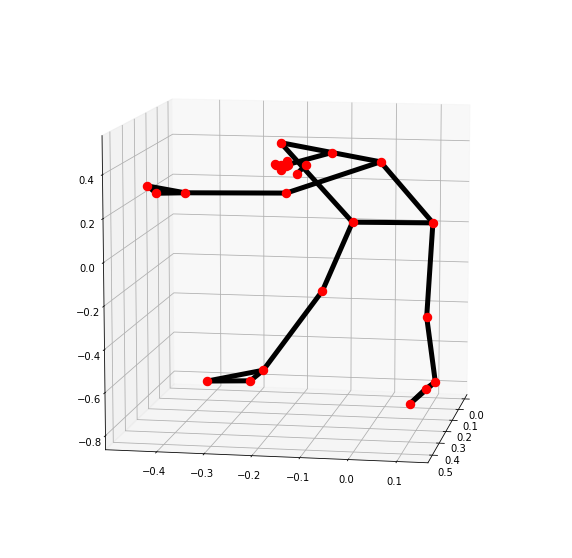

Nose world landmark:
x: -0.19501301646232605
y: -0.31177598237991333
z: -0.5701087713241577
visibility: 0.9991282820701599



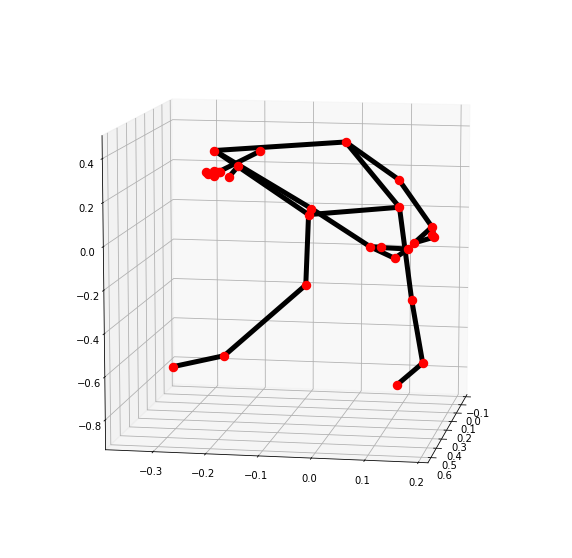

Nose world landmark:
x: -0.15673205256462097
y: -0.4153495132923126
z: -0.4772682785987854
visibility: 0.9992567896842957



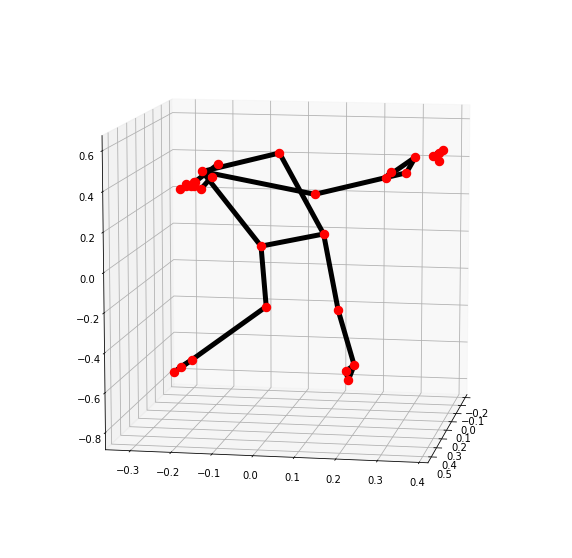

Nose world landmark:
x: 0.029086120426654816
y: -0.6291495561599731
z: -0.010313371196389198
visibility: 0.9998605251312256



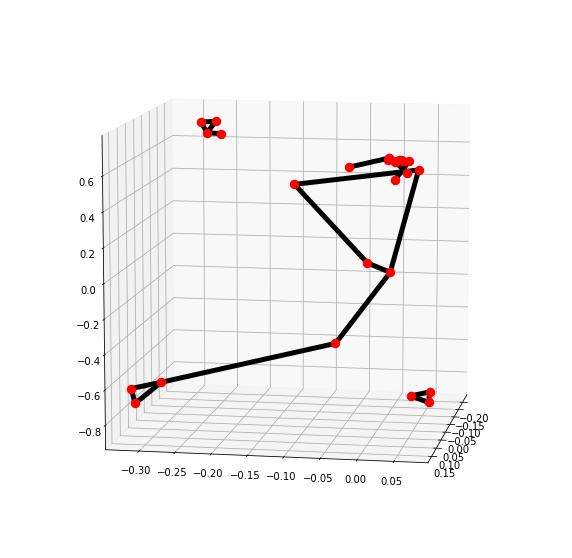

Nose world landmark:
x: 0.4601755142211914
y: -0.3531065583229065
z: -0.16922742128372192
visibility: 0.9999241828918457



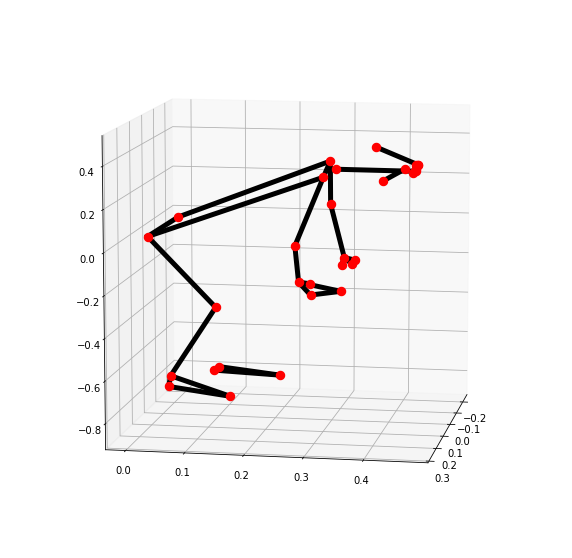

Nose world landmark:
x: 0.4131881892681122
y: -0.317584365606308
z: -0.21361583471298218
visibility: 0.9999176263809204



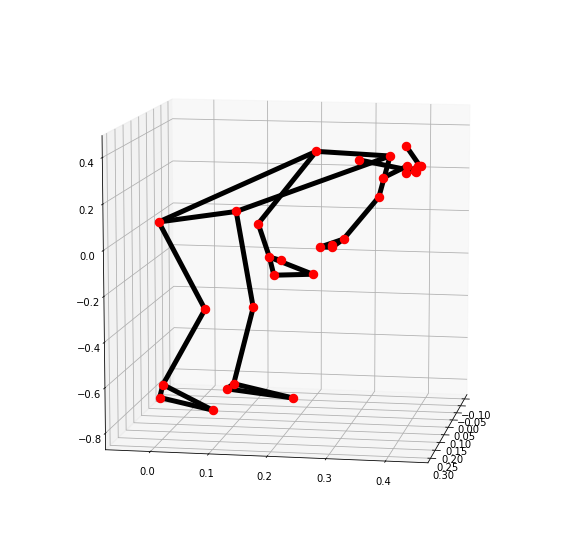

Nose world landmark:
x: 0.4472801685333252
y: -0.3732856810092926
z: -0.08148364722728729
visibility: 0.9990687966346741



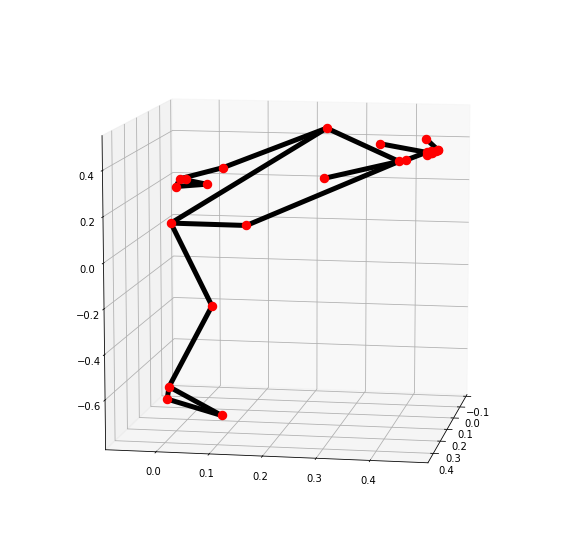

Nose world landmark:
x: 0.42966869473457336
y: -0.36967381834983826
z: -0.1025787964463234
visibility: 0.9969498515129089



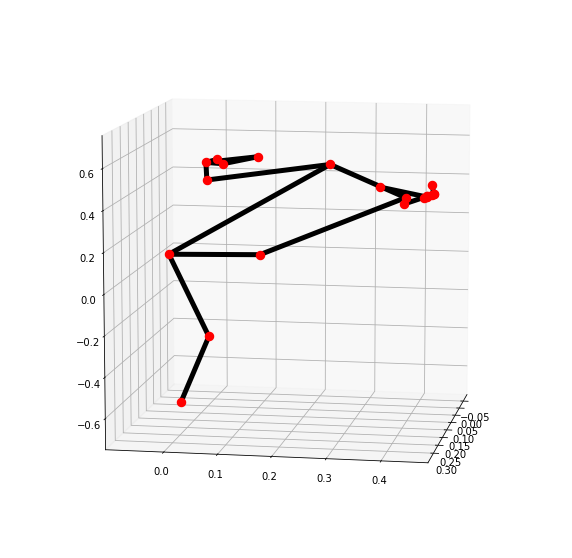

Nose world landmark:
x: 0.4676878750324249
y: -0.342172235250473
z: -0.04196377098560333
visibility: 0.9997897744178772



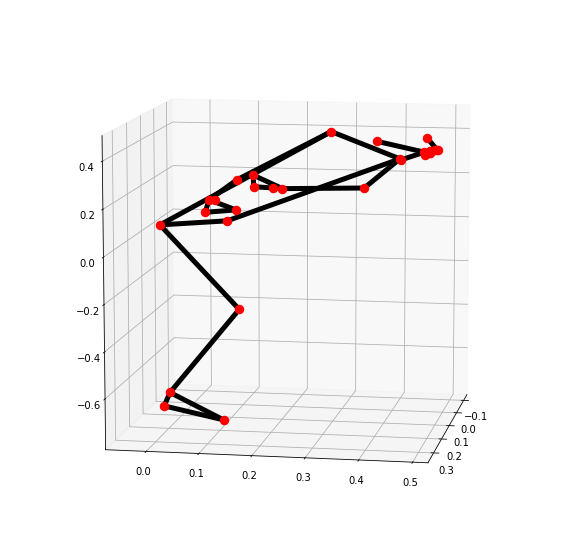

Nose world landmark:
x: 0.4416191577911377
y: -0.35480350255966187
z: -0.018694240599870682
visibility: 0.9996080994606018



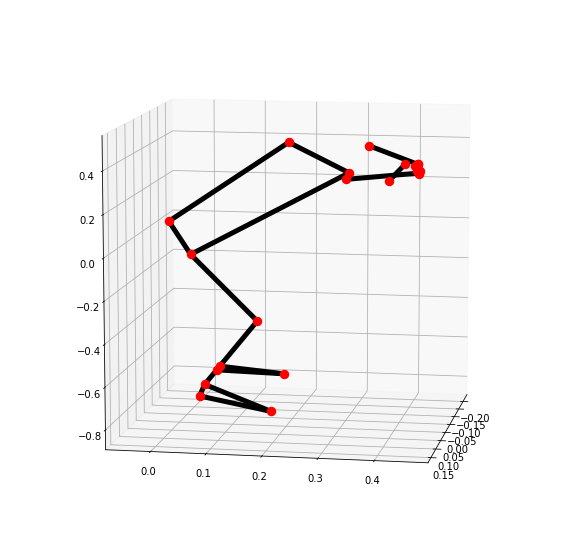

Nose world landmark:
x: 0.1165890023112297
y: -0.6286754012107849
z: -0.021015796810388565
visibility: 0.9998364448547363



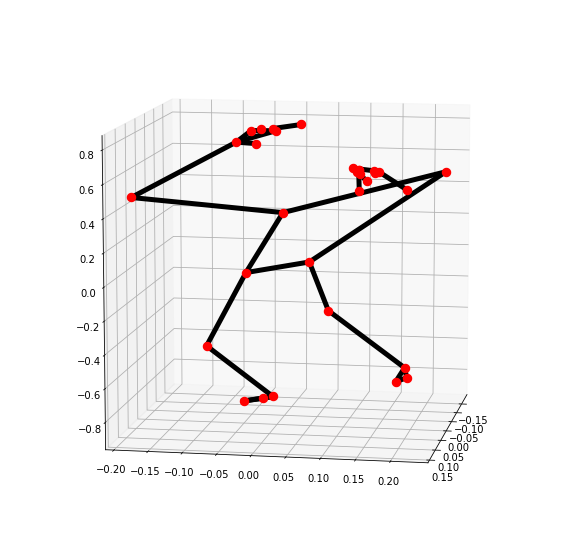

In [ ]:
# Run MediaPipe Pose and plot 3d pose world landmarks.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
  for name, image in images.items():
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Print the real-world 3D coordinates of nose in meters with the origin at
    # the center between hips.
    print('Nose world landmark:'),
    print(results.pose_world_landmarks.landmark[mp_pose.PoseLandmark.NOSE])
    fig, axes = plt.subplots(nrows=1, ncols=1) ## shape=(4,)

    # Plot pose world landmarks.
    mp_drawing.plot_landmarks(
        results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)

Pose segmentation of swing1.jpeg:


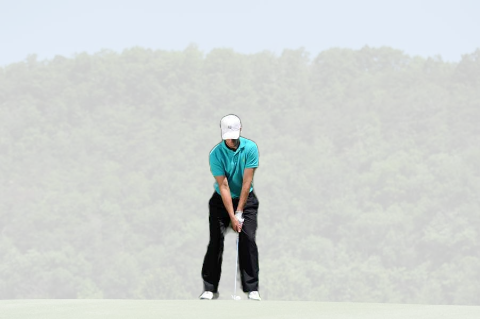

Pose segmentation of swing2.jpeg:


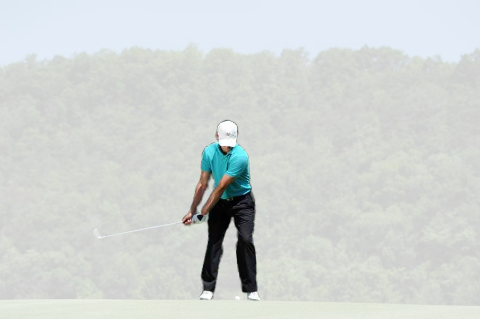

Pose segmentation of swing3.jpeg:


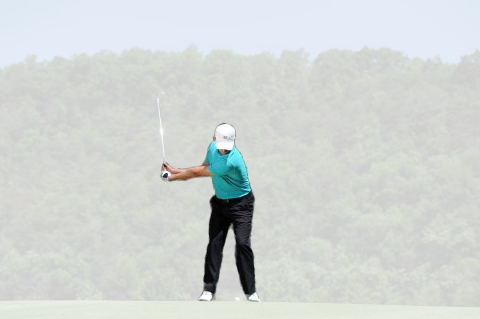

Pose segmentation of swing4.jpeg:


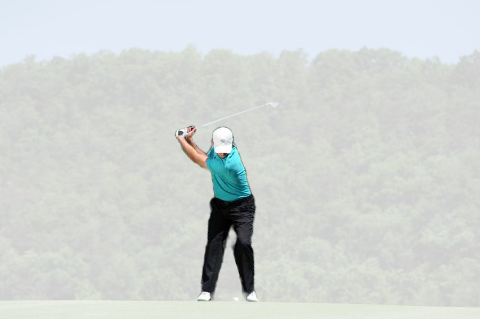

Pose segmentation of swing5.jpeg:


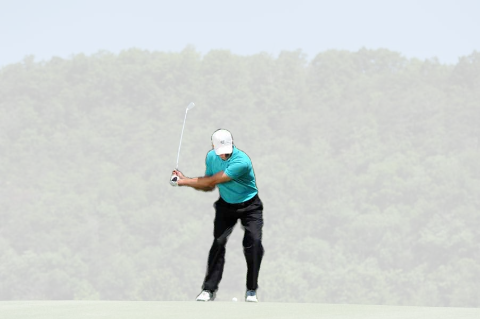

Pose segmentation of swing6.jpeg:


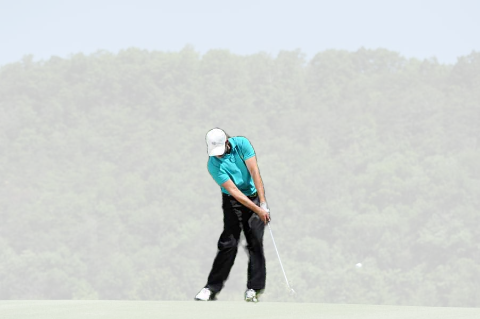

Pose segmentation of swing7.jpeg:


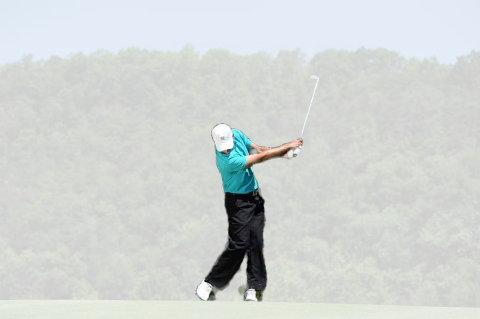

Pose segmentation of swing8.jpeg:


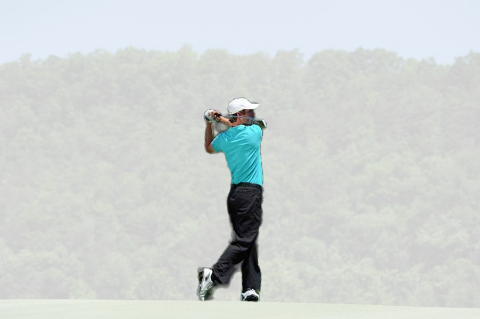

Pose segmentation of swing9.jpeg:


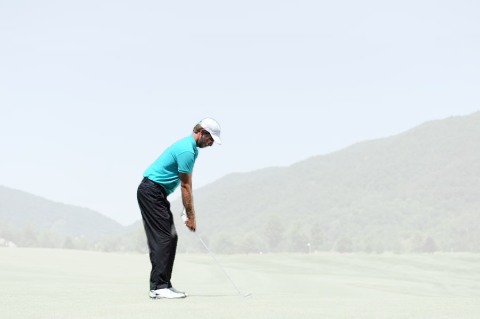

Pose segmentation of swing10.jpeg:


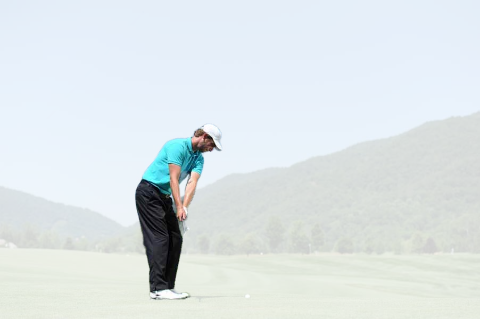

Pose segmentation of swing11.jpeg:


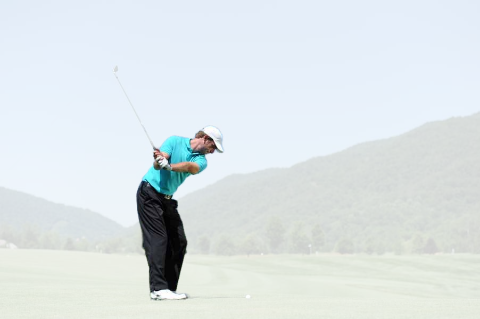

Pose segmentation of swing12.jpeg:


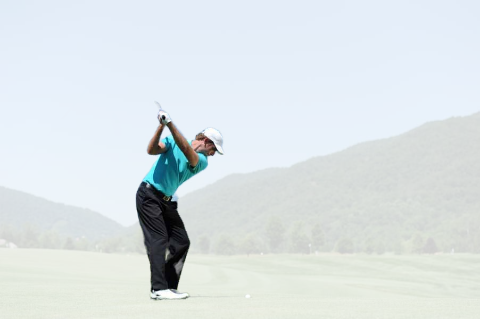

Pose segmentation of swing13.jpeg:


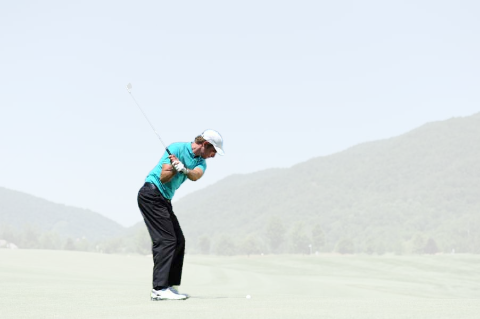

Pose segmentation of swing14.jpeg:


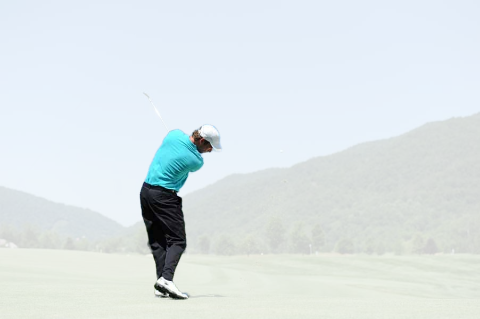

Pose segmentation of swing15.jpeg:


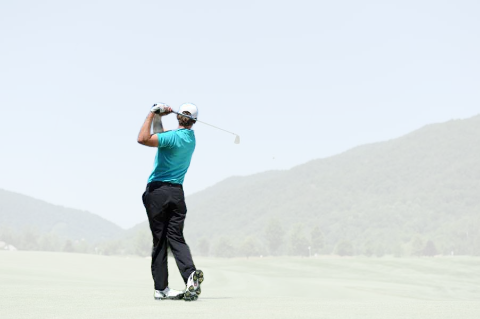

In [ ]:
# Run MediaPipe Pose with `enable_segmentation=True` to get pose segmentation.
with mp_pose.Pose(
    static_image_mode=True, min_detection_confidence=0.5, 
    model_complexity=2, enable_segmentation=True) as pose:
  for name, image in images.items():
    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw pose segmentation.
    print(f'Pose segmentation of {name}:')
    annotated_image = image.copy()
    red_img = np.zeros_like(annotated_image, dtype=np.uint8)
    red_img[:, :] = (255,255,255)
    segm_2class = 0.2 + 0.8 * results.segmentation_mask
    segm_2class = np.repeat(segm_2class[..., np.newaxis], 3, axis=2)
    annotated_image = annotated_image * segm_2class + red_img * (1 - segm_2class)
    resize_and_show(annotated_image)